In [1]:
# !pip install rudalle
# !pip install ruclip

import os

os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [2]:
import torch

import ruclip
from rudalle.pipelines import generate_images, show, super_resolution, cherry_pick_by_ruclip
from rudalle import get_rudalle_model, get_tokenizer, get_vae, get_realesrgan
from rudalle.utils import seed_everything

### Инициализация модели *DALL-E*

In [3]:
device    = "cuda:0" if torch.cuda.is_available() else "cpu"
dalle     = get_rudalle_model("Malevich", pretrained=True, device=device)
tokenizer = get_tokenizer()
vae       = get_vae(dwt=True).to(device)

  0%|          | 0/398 [00:00<?, ?it/s]

◼️ Malevich is 1.3 billion params model from the family GPT3-like, that uses Russian language and text+image multi-modality.
tokenizer --> ready
Working with z of shape (1, 256, 32, 32) = 262144 dimensions.
vae --> ready


### Инициализации моделей *CLIP* и *RealESRGAN*

In [4]:
realesrgan      = get_realesrgan("x2", device=device)
clip, processor = ruclip.load("ruclip-vit-base-patch32-384", device=device)
clip_predictor  = ruclip.Predictor(clip, processor, device, bs=8)

x2 --> ready


In [97]:
text = """Нора была хоббичья, а значит — благоустроенная. 
Она начиналась идеально круглой, как иллюминатор, дверью, выкрашенной зеленой краской, с сияющей медной ручкой точно посередине""" 

pil_images = []
scores = []

seed_everything(30)

for top_k, top_p, images_num in [(2048, 0.99, 12)]:
    _pil_images, _scores = generate_images(text, tokenizer, dalle, vae, top_k=top_k, images_num=images_num, bs=6, top_p=top_p)
    pil_images += _pil_images
    scores     += _scores

  0%|          | 0/1024 [00:00<?, ?it/s]

  0%|          | 0/1024 [00:00<?, ?it/s]

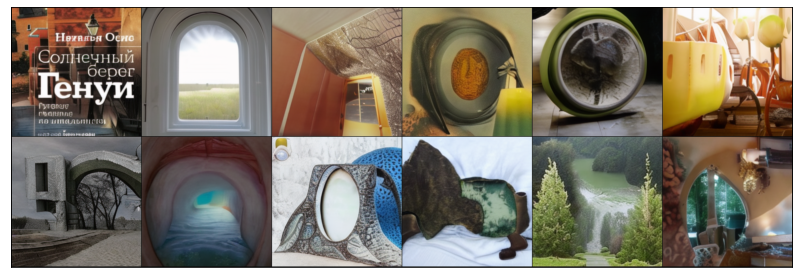

In [98]:
show(pil_images, 6)


12it [00:00, 122.57it/s]


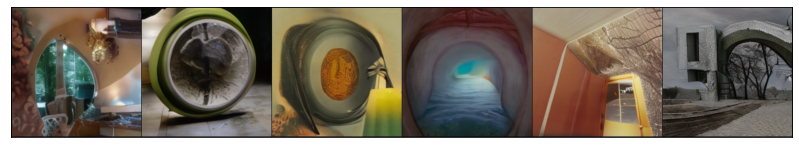

In [99]:
top_images, clip_scores = cherry_pick_by_ruclip(pil_images, text, clip_predictor, count=6)
show(top_images, 6)

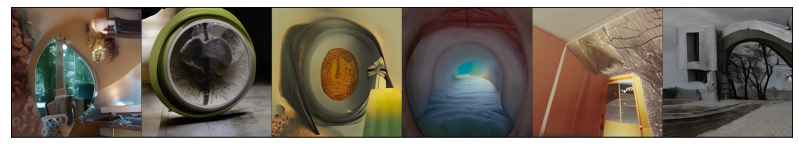

In [100]:
sr_images = super_resolution(top_images, realesrgan)
show(sr_images, 6)

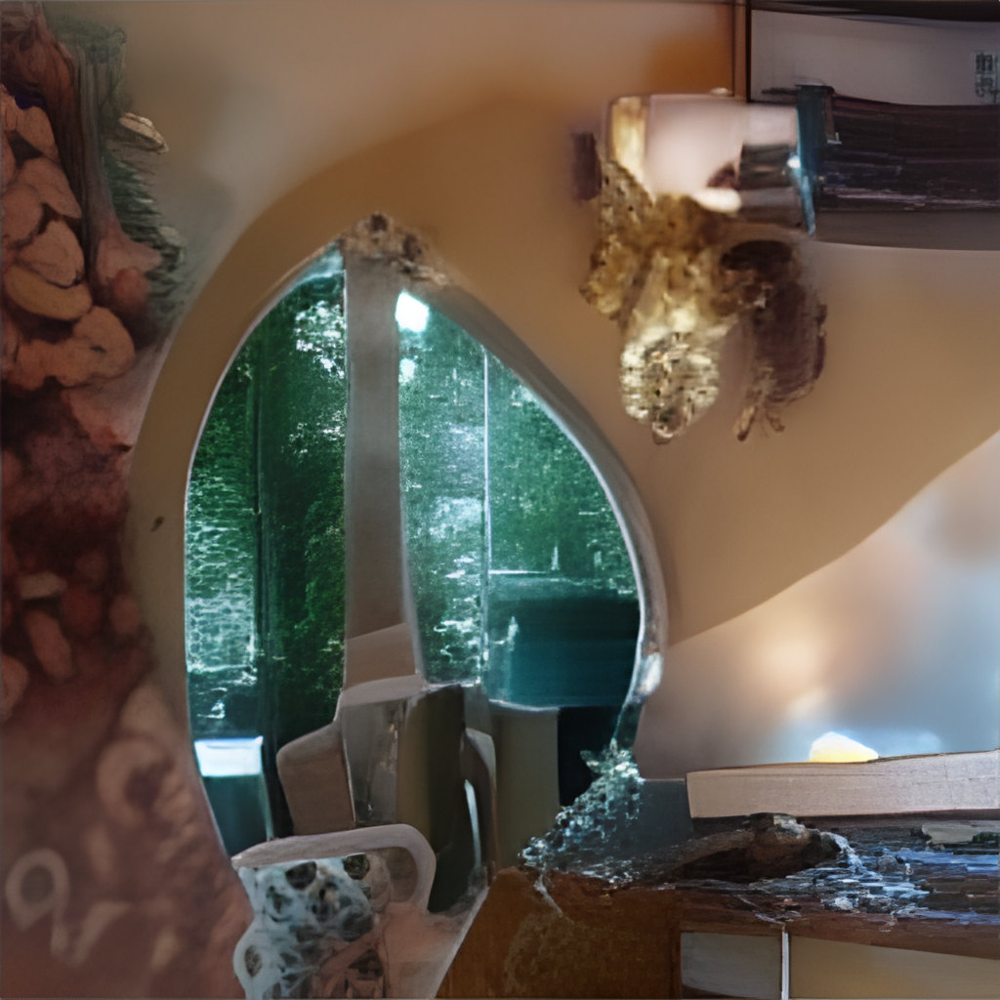

In [101]:
sr_images[0]

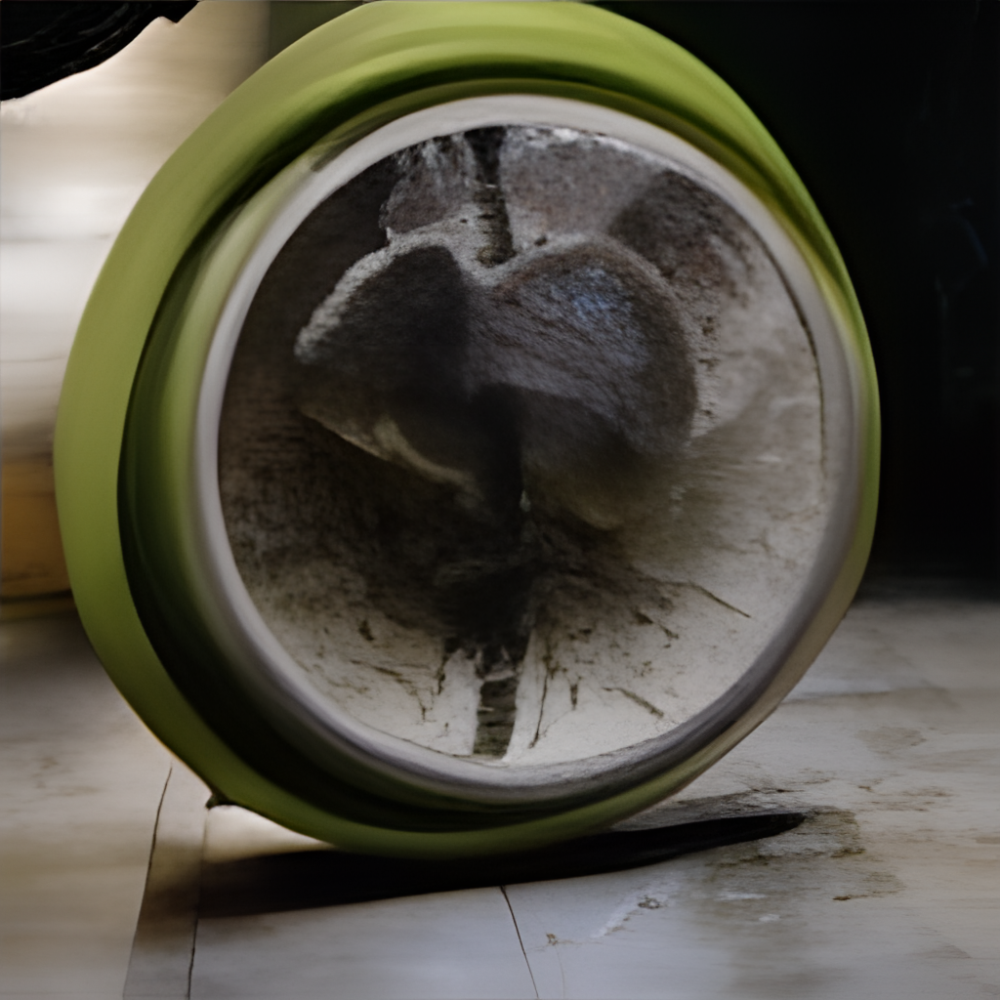

In [102]:
sr_images[1]

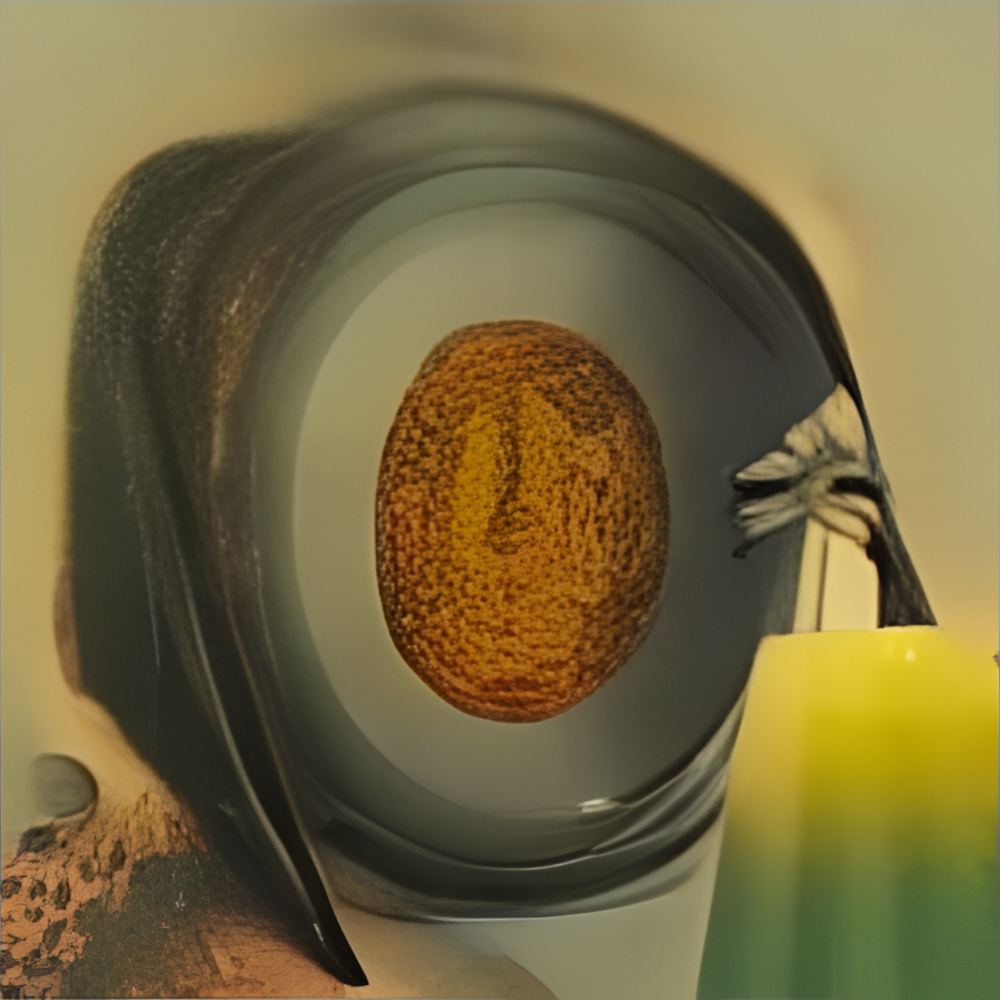

In [103]:
sr_images[2]

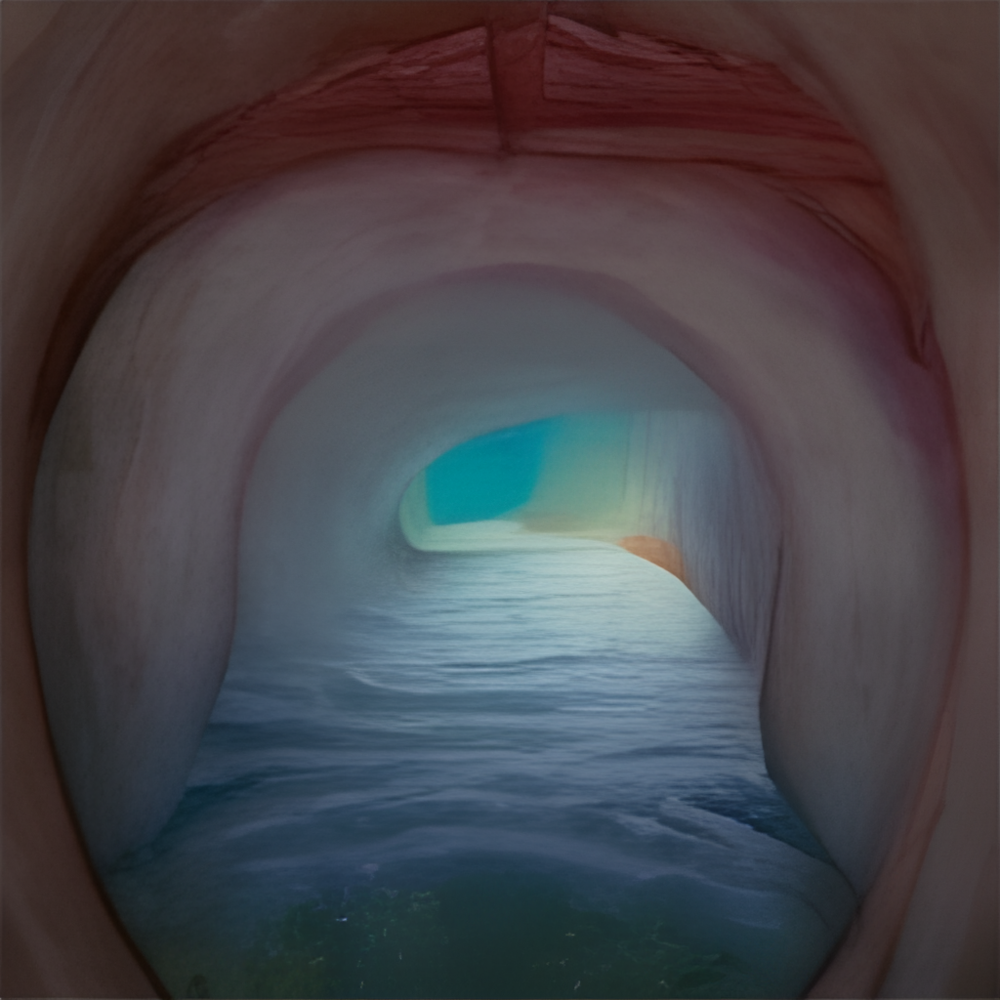

In [104]:
sr_images[3]

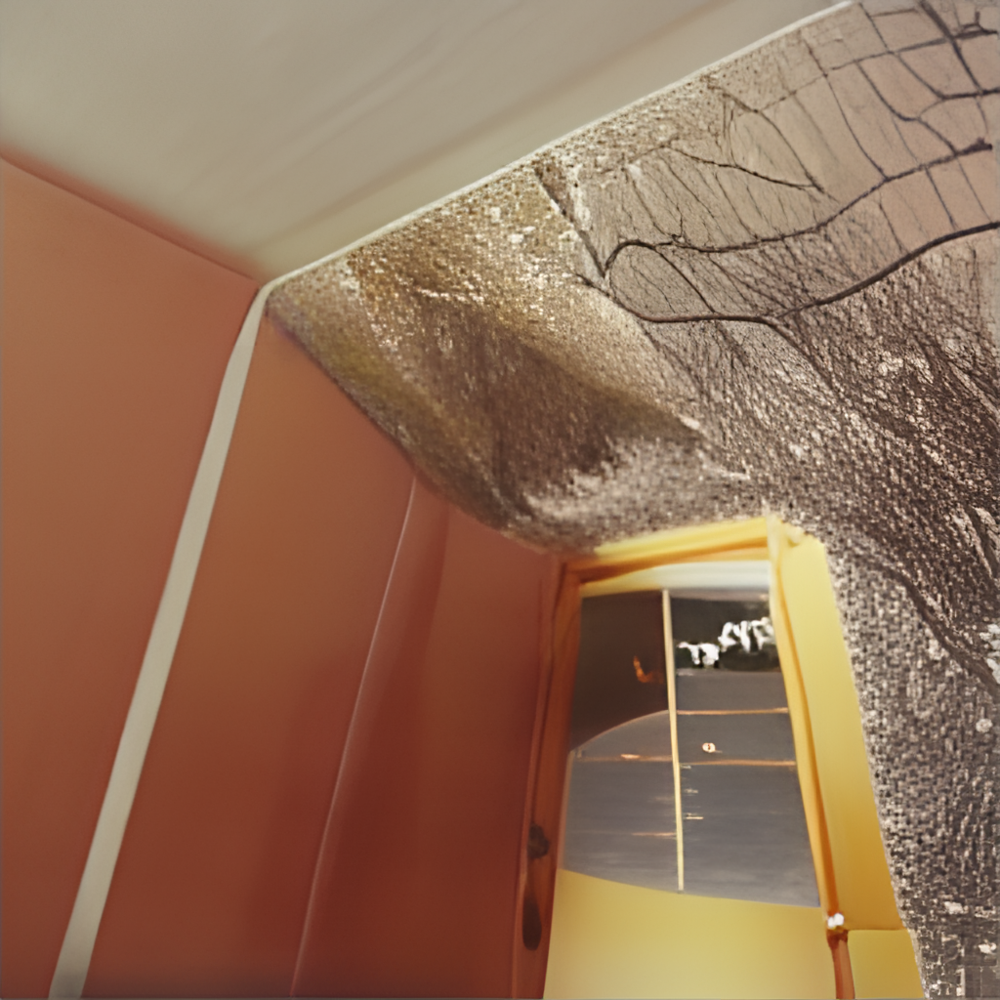

In [105]:
sr_images[4]

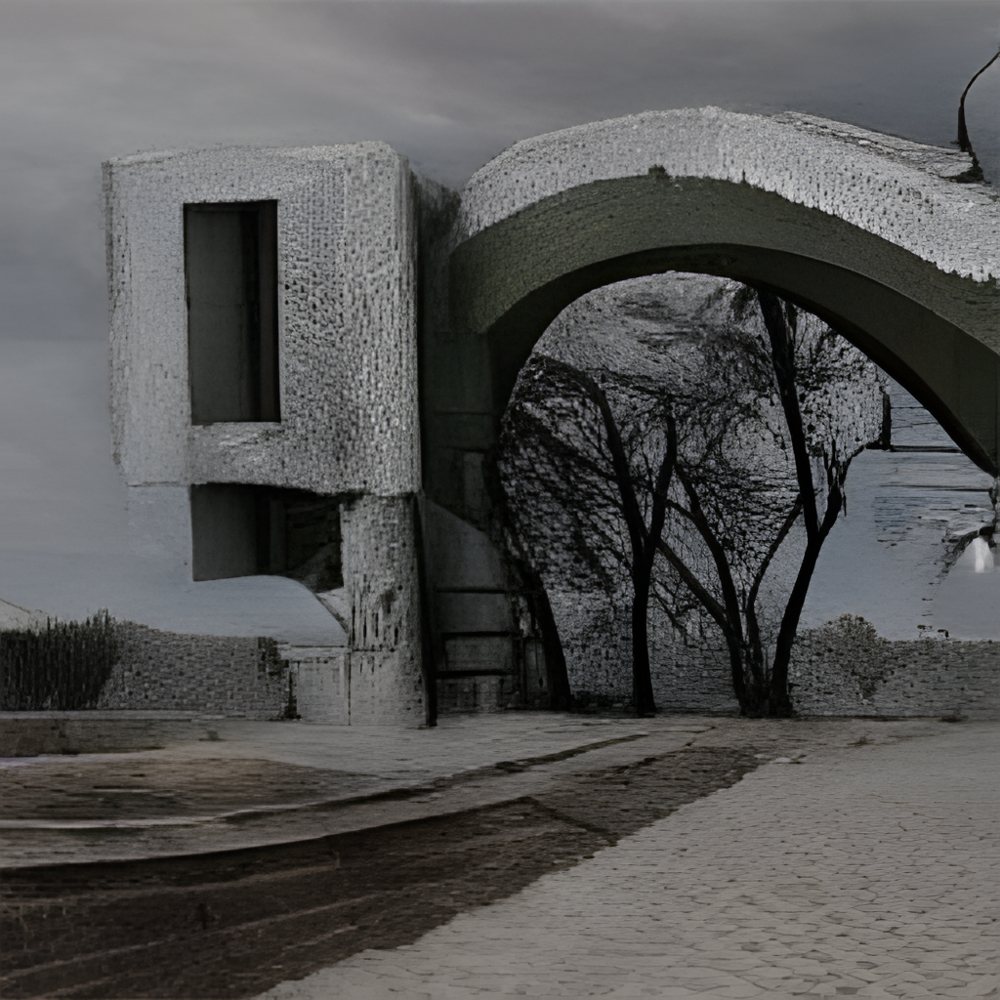

In [106]:
sr_images[5]